<a href="https://colab.research.google.com/github/sokrypton/af_backprop/blob/main/examples/af_design.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#AF Design
Note: this notebook was not optimized or thoroughly tested for protein design. It was designed to test backprop functionality.

In [ ]:
#@title install
%%bash
if [ ! -d af_backprop ]; then
  git clone https://github.com/sokrypton/af_backprop.git
  pip -q install biopython dm-haiku ml-collections py3Dmol
fi
if [ ! -d params ]; then
  mkdir params
  curl -fsSL https://storage.googleapis.com/alphafold/alphafold_params_2021-07-14.tar | tar x -C params
fi
wget -qnc https://raw.githubusercontent.com/sokrypton/ColabFold/main/beta/colabfold.py

Cloning into 'af_backprop'...


In [ ]:
#@title import libraries
import sys
sys.path.append('/content/af_backprop')

import numpy as np

import jax
import jax.numpy as jnp

import tensorflow as tf
tf.config.set_visible_devices([], 'GPU')

def clear_mem():
  backend = jax.lib.xla_bridge.get_backend()
  for buf in backend.live_buffers(): buf.delete()

from jax.example_libraries.optimizers import adam

from alphafold.common import protein
from alphafold.data import pipeline, templates
from alphafold.model import data, config, model, modules
from alphafold.common import residue_constants

from alphafold.model import all_atom
from alphafold.model import folding

# custom functions
from utils import *
import colabfold as cf

##############################################################
# PLOTTING FUNCTIONS
##############################################################

import py3Dmol
import matplotlib
from matplotlib import animation
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from IPython.display import HTML

def make_animation(xyz, seq, plddt=None, pos_ref=None, line_w=2.0, dpi=100, interval=60, color_msa="Taylor"):

  def align(P, Q):
    p = P - P.mean(0,keepdims=True)
    q = Q - Q.mean(0,keepdims=True)
    return p @ cf.kabsch(p,q)

  if pos_ref is None: pos_ref = xyz[-1]
  pos_ref = pos_ref - pos_ref.mean(0,keepdims=True)
  pos_ref = pos_ref @ cf.kabsch(pos_ref,pos_ref,return_v=True)

  new_positions = []
  for i in range(len(xyz)):
    new_positions.append(align(xyz[i],pos_ref))
  pos = np.asarray(new_positions)

  fig = plt.figure()
  gs = GridSpec(4,1, figure=fig)
  ax1,ax2 = fig.add_subplot(gs[:3,:]),fig.add_subplot(gs[3:,:])
  fig.subplots_adjust(top = 0.90, bottom = 0.10, right = 0.9, left = 0.1, hspace = 0, wspace = 0)
  fig.set_figwidth(6); fig.set_figheight(6)
  fig.set_dpi(dpi)

  ax2.set_xlabel("positions")
  ax2.set_yticks([])
  if seq[0].ndim == 3: ax2.set_ylabel("sequences")

  #z_min,z_max = pos_ref[...,2].min(),pos_ref[...,2].max()
  xy_min,xy_max = pos_ref[...,:2].min() - 5, pos_ref[...,:2].max() + 5
  for ax in [ax1]:
    ax.set_xlim(xy_min, xy_max); ax.set_ylim(xy_min, xy_max)
    ax.axis(False)

  ims = []
  for k in range(len(pos)):
    x,s = pos[k],seq[k]
    if plddt is None:
      ims.append([cf.add_text("colored by N→C", ax1)])
      ims[-1].append(cf.plot_pseudo_3D(x, ax=ax1, line_w=line_w)) #, zmin=z_min, zmax=z_max))
    else:
      ims.append([cf.add_text("colored by pLDDT", ax1)])
      p = plddt[k]
      ims[-1].append(cf.plot_pseudo_3D(x, c=p, cmin=0.5, cmax=0.9, ax=ax1, line_w=line_w)) #, zmin=z_min, zmax=z_max))
    if s.ndim == 2:
      ims[-1].append(ax2.imshow(s.T, animated=True, cmap="bwr_r",vmin=-1, vmax=1))
    else:
      cmap = matplotlib.colors.ListedColormap(jalview_color_list[color_msa])
      vmax = len(jalview_color_list[color_msa]) - 1
      ims[-1].append(ax2.imshow(s.argmax(-1), animated=True, cmap=cmap, vmin=0, vmax=vmax, interpolation="none"))

  ani = animation.ArtistAnimation(fig, ims, blit=True, interval=interval)
  plt.close()
  return ani.to_html5_video()

def plot_pdb(pdb_filename):
  view = py3Dmol.view(js='https://3dmol.org/build/3Dmol.js')
  view.addModel(pdb_to_string(pdb_filename),'pdb')
  view.setStyle({'cartoon': {}})
  BB = ['C','O','N']
  view.addStyle({'and':[{'resn':["GLY","PRO"],'invert':True},{'atom':BB,'invert':True}]},
                      {'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
  view.addStyle({'and':[{'resn':"GLY"},{'atom':'CA'}]},
                {'sphere':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
  view.addStyle({'and':[{'resn':"PRO"},{'atom':['C','O'],'invert':True}]},
                {'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})  
  view.zoomTo()
  view.show()

def get_seqs(seq):
  x = seq.argmax(-1)
  if x.ndim == 1:
    return "".join([order_restype[a] for a in x])
  else:
    return ["".join([order_restype[a] for a in s]) for s in x]

@jax.jit
def subsample_params(n, params):
  return jax.tree_map(lambda x:x[n], params)


In [ ]:
#@title design function

##############################################################
# SETUP GRADIENTSx
##############################################################
def get_grad_fn(inputs, model, batch=None):

  # setup function to get gradients
  def mod(params, key, model_params, opt):
    ############################
    # set amino acid sequence
    ############################
    seq_logits = params["seq"]
    if seq_logits.ndim == 3:
      # if MSA, select different sequence to be first at each iteration
      i = jax.random.randint(key,[],0,seq_logits.shape[0])
      seq_logits = seq_logits.at[0].set(seq_logits[i]).at[i].set(seq_logits[0])
    seq = soft_seq(seq_logits)
    
    if "mask" in opt:
      mask = opt["mask"][:,None]
      pseudo_seq = mask * seq + (1-mask) * seq_logits
      pseudo_seq_save = mask * soft_seq(params["seq"]) + (1-mask) * params["seq"]
    else:
      pseudo_seq = seq
      pseudo_seq_save = soft_seq(params["seq"])

    inputs_mod = inputs.copy()
    if model["opt"]["recycle_mode"] == "sample":
      recycles = jax.random.randint(key,(1,), 0, model["opt"]["num_recycles"] + 1)
      inputs_mod["num_iter_recycling"] = recycles
    else:
      recycles = recycles = jnp.asarray([model["opt"]["num_recycles"]])
    update_seq(pseudo_seq, inputs_mod, msa_input=(seq.ndim == 3))
    
    ####################
    # set sidechains identity
    ####################
    N,L = inputs_mod["aatype"].shape[:2]
    if seq.ndim == 3:
      aatype = jnp.zeros((N,L,21)).at[...,:20].set(seq[0])
    else:
      aatype = jnp.zeros((N,L,21)).at[...,:20].set(seq)

    if "mask" in opt:
      ALA = jax.nn.one_hot(residue_constants.restype_order["A"],21)
      aatype_ala = jnp.zeros((N,L,21)).at[:].set(ALA)
      aatype_pseudo = mask * aatype + (1-mask) * aatype_ala
    else:
      aatype_pseudo = aatype

    update_aatype(aatype_pseudo, inputs_mod)
    
    # get output
    outputs = model["runner"].apply(model_params, key, inputs_mod)
    dgram_logits = outputs["distogram"]["logits"]
    plddt_logits = outputs["predicted_lddt"]["logits"]
    pae_logits = outputs["predicted_aligned_error"]["logits"]
            
    # confidence losses
    pae_loss = jax.nn.softmax(pae_logits)
    pae_loss = (pae_loss * jnp.arange(pae_loss.shape[-1])).mean(-1).mean()
    plddt_loss = jax.nn.softmax(plddt_logits)
    plddt_loss = (plddt_loss * jnp.arange(plddt_loss.shape[-1])[::-1]).mean(-1).mean()
    losses = {"pae":pae_loss,"plddt":plddt_loss}

    if batch is None:
      # if no batch provided, we'll be doing some hallucination!
      # note: we find maximizing just the confidence results in single extended helices
      # to promote compact structure we add a loss to maximize number of contracts via dgram.
      contact_loss = -jax.nn.logsumexp(jax.nn.log_softmax(dgram_logits)[...,:-1],-1).mean()
      losses.update({"contact":contact_loss})      
      loss = 1.0 * (pae_loss + plddt_loss) + 0.5 * contact_loss

    else:
      dgram_loss = get_dgram_loss(batch, outputs, logits=dgram_logits, model_config=model["runner"].config)
      fape_loss = get_fape_loss(batch, outputs, model_config=model["runner"].config)      
      rmsd_loss = get_rmsd_loss(batch, outputs) # note: rmsd monitored but not used in loss
      losses.update({"rmsd":rmsd_loss,"dgram":dgram_loss,"fape":fape_loss})

      # note: we find dgram loss to easier to backprop through
      loss = opt["conf"] * (pae_loss + plddt_loss) + dgram_loss #+ fape_loss

    # if MSA add entropy loss
    if seq.ndim == 3 and "ent" in opt:
      seq_prf = seq.mean(0)
      ent_loss = -(seq_prf * jnp.log(seq_prf + 1e-8)).sum(-1).mean()
      losses["ent"] = ent_loss
      loss += ent_loss * opt["ent"]

    outs = {"final_atom_positions":outputs["structure_module"]["final_atom_positions"],
            "final_atom_mask":outputs["structure_module"]["final_atom_mask"],
            "dgram":outputs["distogram"]["logits"],
            "plddt":get_plddt(outputs),
            "recycles":recycles}

    return loss, ({"losses":losses,"outputs":outs,"seq":seq,"pseudo_seq":pseudo_seq_save})
  
  return jax.value_and_grad(mod, has_aux=True, argnums=0)


##############################################################
# PREP INPUTS
##############################################################
def prep(model, starting_sequence):
  '''prep input features'''
  num_seq = model["opt"]["num_seq"]
  feature_dict = {
      **pipeline.make_sequence_features(sequence=starting_sequence,
                                        description="none", num_res=len(starting_sequence)),
      **pipeline.make_msa_features(msas=[num_seq*[starting_sequence]],
                                   deletion_matrices=[num_seq*[[0]*len(starting_sequence)]]),
  }
  inputs = model["runner"].process_features(feature_dict, random_seed=0)
  if num_seq > 1:
    inputs["msa_row_mask"] = jnp.ones_like(inputs["msa_row_mask"])
    inputs["msa_mask"] = jnp.ones_like(inputs["msa_mask"])

  return inputs  


def prep_inputs(model, pdb_filename, chain=None):
  '''prep inputs for fixed backbone design'''
  # setup inputs
  protein_obj = protein.from_pdb_string(pdb_to_string(pdb_filename), chain_id=chain)
  batch = {'aatype': protein_obj.aatype,
           'all_atom_positions': protein_obj.atom_positions,
           'all_atom_mask': protein_obj.atom_mask}

  has_ca = batch["all_atom_mask"][:,0] == 1
  batch = jax.tree_map(lambda x:x[has_ca], batch)

  batch.update(all_atom.atom37_to_frames(**batch))
  starting_sequence = "".join([order_restype[a] for a in batch["aatype"]])
  inputs = prep(model, starting_sequence)

  # update residue index from pdb
  residue_index = protein_obj.residue_index[has_ca]
  inputs["residue_index"] = jnp.asarray(inputs["residue_index"]).at[:,:].set(residue_index)

  wt_seq = jax.nn.one_hot(batch["aatype"],20)

  # gradient function
  grad_fn = get_grad_fn(inputs, model, batch)
  grad = jax.jit(grad_fn)
  grad_multi = jax.jit(jax.vmap(grad_fn,(None,None,0,None)))

  return {"seq":wt_seq, "inputs":inputs,
          "batch":batch, "model":model,
          "grad":grad,"grad_multi":grad_multi}
  
def prep_hal_inputs(model, length=100):
  '''prep inputs for hallucination'''
  starting_sequence = "A"*length
  inputs = prep(model, starting_sequence)
  seq = jax.nn.one_hot(inputs["aatype"][0],20)

  # gradient function
  grad_fn = get_grad_fn(inputs, model)
  grad = jax.jit(grad_fn)
  grad_multi = jax.jit(jax.vmap(grad_fn,(None,None,0,None)))

  return {"seq":seq, "inputs":inputs, "model":model,
          "grad":grad,"grad_multi":grad_multi}

##############################################################
# DO DESIGN
####################################
##########################

def do_design(inputs, outputs=None, iters=300, seed=None,
              ent_weight=0.01, conf_weight=0.1, one_hot=True, one_hot_switch=5,
              learning_rate=1e-2, save_traj=True, restart=False,
              verbose=True):
  if seed is None:
    seed = np.random.randint(10000)

  def init_state(o, init_fun):
    o["L"],o["A"] = inputs["seq"].shape
    o["key"] = jax.random.PRNGKey(seed)
    if inputs["model"]["opt"]["num_seq"] > 1:
      seq_shape = (inputs["model"]["opt"]["num_seq"],o["L"],o["A"])
    else:
      seq_shape = (o["L"],o["A"])
    if one_hot:
      seq = 0.01 * jax.random.normal(o["key"],seq_shape)
      o["mask"] = jnp.ones((o["L"],))
      o["state"] = init_fun({"seq":seq})
    else:
      seq = jnp.zeros(seq_shape)
      o["mask"] = jnp.zeros((o["L"],))
      o["state"] = init_fun({"seq":seq})
    o["k"] = 0
    o["traj"] = {"xyz":[],"seq":[],"plddt":[]}
    o["loss"],o["best_outs"] = np.inf, None
    return o    

  if outputs is None:
    # setup optimizer    
    o = {}  
    o["adam"] = init_fun, update_fun, get_params = adam(step_size=learning_rate)
    o = init_state(o, init_fun)

  else:
    o = outputs
    init_fun, update_fun, get_params = o["adam"]
    if restart: o = init_state(o, init_fun)  
  
  def step(k, state, key, model_params, opt, multi=False):
    if multi:
      (loss, outs), grad = inputs["grad_multi"](get_params(state), key, model_params, opt)
      # take the mean of gradients and loss
      grad = jax.tree_map(lambda x: x.mean(0), grad)
      outs["losses"] = jax.tree_map(lambda x: x.mean(0), outs["losses"])
      loss = loss.mean(0)

      # use first model
      outs["outputs"] = jax.tree_map(lambda x:x[0], outs["outputs"])
      outs["seq"] = outs["seq"][0]
      outs["pseudo_seq"] = outs["pseudo_seq"][0]
    else:
      (loss, outs), grad = inputs["grad"](get_params(state), key, model_params,opt)

    grad["seq"] = grad["seq"] / jnp.sqrt(jnp.square(grad["seq"]).sum([-1,-2],keepdims=True))
    state = update_fun(k, grad, state)
    return state, outs, loss
  

  best_loss = np.inf
  k = o["k"]
  while k < o["k"] + iters: # number of iterations
    o["key"], subkey = jax.random.split(o["key"])
    opt = {"mask":o["mask"],"ent":ent_weight,"conf":conf_weight}
    ## sample gradients
    num_models = inputs["model"]["opt"]["num_models"]
    if num_models == 1:
      n = jax.random.randint(subkey,[],0,5)
      o["state"], outs, loss = step(k, o["state"], subkey, inputs["model"]["params"][n], opt)
    else:
      if num_models == 5:
        n = jnp.arange(5)
        model_params_multi = inputs["model"]["params_multi"]
      else:
        n = jax.random.choice(subkey,jnp.arange(5),(num_models,),replace=False)
        model_params_multi = subsample_params(n,inputs["model"]["params_multi"])
      o["state"], outs, loss = step(k, o["state"], subkey, model_params_multi, opt, multi=True)

    losses = outs["losses"]   
    recycles = int(outs["outputs"]["recycles"][0])
    all_recycles = recycles == inputs["model"]["opt"]["num_recycles"]

    # print output
    if verbose:
      losses_print = f'loss: {loss:.3f}'
      if "batch" in inputs:
        losses["seqid"] = (outs["seq"].argmax(-1) == inputs["seq"].argmax(-1)).mean()
        for l in ["ent","seqid","pae","plddt","dgram","fape","rmsd"]:
          if l in losses: losses_print += f' {l}: {losses[l]:.3f}'
      else:
        for l in ["contact","pae","plddt"]:
          losses_print += f' {l}: {losses[l]:.3f}'

      print(f'{int(k)}\tmodel: {n} recycle: {recycles} num_one_hot: {int(o["mask"].sum())} {losses_print}')

    # save for animation
    if all_recycles and save_traj:
      o["traj"]["xyz"].append(np.asarray(outs["outputs"]["final_atom_positions"][:,1,:]))
      o["traj"]["plddt"].append(np.asarray(outs["outputs"]["plddt"]))
      o["traj"]["seq"].append(np.asarray(outs["pseudo_seq"]))

    # save best result
    if all_recycles and o["mask"].sum() == o["L"] and loss < o["loss"]:
      o["loss"] = loss
      o["best_outs"] = outs

    if one_hot and int(k+1) % one_hot_switch == 0 and o["mask"].sum() < o["L"]:          
      # pick random position to flip to one_hot
      o["mask"] = o["mask"].at[np.random.choice(np.where(o["mask"] == 0)[0])].set(1)   

    # increment based on number of recycles
    k = round(k + (recycles+1)/(inputs["model"]["opt"]["num_recycles"]+1), 3)
  o["k"] = k  
  return o

In [ ]:
#@title setup model
##############################################################
# SETUP MODEL
##############################################################
def prep_model(num_seq, num_recycles, dropout, recycle_mode, num_models):  
  # setup which model params to use
  model_name = "model_3_ptm"
  model_config = config.model_config(model_name)

  # enable checkpointing
  model_config.model.global_config.use_remat = True

  # number of sequences
  model_config.data.eval.max_msa_clusters = num_seq
  model_config.data.common.max_extra_msa = 1
  model_config.data.eval.masked_msa_replace_fraction = 0

  # number of recycles
  # NOTE: for denovo-designed proteins we find 1 recycle is enough to predict them
  model_config.model.num_recycle = num_recycles
  model_config.data.common.num_recycle = num_recycles

  # backprop through recycles
  # we find adding backprop through all recycles does not seem to help
  # but maybe it will in other contexts/problems.
  model_config.model.add_prev = recycle_mode == "add_prev"
  model_config.model.backprop_recycle = recycle_mode == "backprop"
  model_config.model.embeddings_and_evoformer.backprop_dgram = recycle_mode == "backprop"

  # dropout (disable dropout by uncomment line below)
  if not dropout:
    model_config = set_dropout(model_config, 0.0)

  # setup model
  model_params = [data.get_model_haiku_params(model_name=model_name, data_dir=".")]
  model_runner = model.RunModel(model_config, model_params[0], is_training=True)

  # load the other model_params (during optimization, we randomly pick which model to use)
  for model_name in ["model_1_ptm","model_2_ptm","model_4_ptm","model_5_ptm"]:
    params = data.get_model_haiku_params(model_name, '.')
    model_params.append({k: params[k] for k in model_runner.params.keys()})

  # combine model params (for parallel compute)
  model_params_multi = jax.tree_multimap(lambda *values: jnp.stack(values, axis=0), *model_params)

  return {"opt":{"num_seq":num_seq,
                 "num_recycles":num_recycles,
                 "dropout":dropout,
                 "recycle_mode":recycle_mode,
                 "num_models":num_models},
          "runner":model_runner,
          "params":model_params,
          "params_multi":model_params_multi}

##############################################################
# GET OPTIONS
##############################################################

num_seq = 1 
num_recycles = 0 #@param ["0", "1", "2", "3"] {type:"raw"}
#@markdown - `num_recycles` - Max number of recycles to use during design (for most denovo proteins we find 0 is enough)
dropout = True #@param ["True", "False"] {type:"raw"}
#@markdown - `dropout` - Use dropout during design (helps jump out of local minima)
recycle_mode = "sample" #@param ["sample", "add_prev", "last", "backprop"]
#@markdown - `sample` - At each iteration, randomly select number of recycles to use. (Recommended)
#@markdown - `add_prev` - Add prediction logits (dgram, pae, plddt) across all recycles. (Most stable, but slow and requires more memory).
#@markdown - `last` - Only use gradients from last recycle.
#@markdown - `backprop` - Use outputs from last recycle, but backprop through all recycles.

num_models = 1 #@param ["1", "2", "3", "4", "5"] {type:"raw"}
#@markdown - `num_models` - number of random model params to use at each iteration. If >1, multiple models are sampled and gradients are averaged.

clear_mem()
MODEL = prep_model(num_seq, num_recycles, dropout, recycle_mode, num_models)

# fixed backbone design

In [ ]:
example = "1QYS"
!wget -qnc https://files.rcsb.org/view/{example}.pdb

# prep features
inputs = prep_inputs(MODEL, pdb_filename=f"{example}.pdb", chain="A")

In [ ]:
# do it
# note pae and plddt values are between 0 and 1 (lower better)
outputs = do_design(inputs)

0	1	92 loss: 3.577 seqid: 0.065 pae: 0.590 plddt: 0.631 dgram: 3.455 fape: 2.098 rmsd: 14.661
1	1	92 loss: 4.064 seqid: 0.087 pae: 0.672 plddt: 0.500 dgram: 3.947 fape: 2.602 rmsd: 19.725
2	1	92 loss: 3.679 seqid: 0.054 pae: 0.606 plddt: 0.664 dgram: 3.552 fape: 1.980 rmsd: 14.394
3	0	92 loss: 3.701 seqid: 0.065 pae: 0.568 plddt: 0.599 dgram: 3.584 fape: 2.125 rmsd: 11.633
3	0	92 loss: 3.710 seqid: 0.054 pae: 0.517 plddt: 0.535 dgram: 3.605 fape: 1.959 rmsd: 13.082
4	0	92 loss: 3.709 seqid: 0.065 pae: 0.616 plddt: 0.597 dgram: 3.588 fape: 2.270 rmsd: 15.538
4	0	92 loss: 3.720 seqid: 0.065 pae: 0.597 plddt: 0.570 dgram: 3.604 fape: 2.218 rmsd: 16.876
5	0	92 loss: 3.588 seqid: 0.054 pae: 0.636 plddt: 0.659 dgram: 3.459 fape: 2.116 rmsd: 15.346
5	1	92 loss: 3.568 seqid: 0.054 pae: 0.661 plddt: 0.699 dgram: 3.432 fape: 2.106 rmsd: 15.798
6	0	92 loss: 3.515 seqid: 0.043 pae: 0.622 plddt: 0.649 dgram: 3.388 fape: 1.969 rmsd: 14.402
7	1	92 loss: 3.444 seqid: 0.043 pae: 0.575 plddt: 0.625 dgra

In [ ]:
pos_ref = inputs["batch"]["all_atom_positions"][:,1,:]
HTML(make_animation(**outputs["traj"], pos_ref=pos_ref))

In [ ]:
save_pdb(outputs["best_outs"],f"{example}.tmp.pdb")
plot_pdb(f"{example}.tmp.pdb")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [ ]:
print(get_seqs(outputs["best_outs"]["seq"]))

PHWIWVCMHNEGGHECRVYHTRNRKARKAAIKRIMDQMETAGDGMMHIWIFMPSPRKTHAIYKKLRGLFTKENCTEVHYHYHGNYYYMHMET


# hallucination

In [ ]:
LEN = 100
inputs = prep_hal_inputs(MODEL, length=LEN)

In [ ]:
outputs = do_design(inputs, iters=50)

0	0	100 loss: 1.351 contact: 0.638 pae: 0.553 plddt: 0.479
0	0	100 loss: 1.523 contact: 0.459 pae: 0.635 plddt: 0.658
1	0	100 loss: 1.561 contact: 0.506 pae: 0.644 plddt: 0.665
1	0	100 loss: 1.379 contact: 0.426 pae: 0.569 plddt: 0.598
2	0	100 loss: 1.289 contact: 0.397 pae: 0.525 plddt: 0.565
2	0	100 loss: 1.334 contact: 0.434 pae: 0.549 plddt: 0.567
3	1	100 loss: 1.358 contact: 0.454 pae: 0.557 plddt: 0.574
4	0	100 loss: 1.351 contact: 0.444 pae: 0.551 plddt: 0.578
4	0	100 loss: 1.172 contact: 0.393 pae: 0.481 plddt: 0.494
5	1	100 loss: 1.272 contact: 0.405 pae: 0.531 plddt: 0.538
6	0	100 loss: 1.332 contact: 0.408 pae: 0.556 plddt: 0.572
6	1	100 loss: 1.366 contact: 0.431 pae: 0.562 plddt: 0.588
7	1	100 loss: 1.341 contact: 0.519 pae: 0.551 plddt: 0.531
8	0	100 loss: 1.218 contact: 0.483 pae: 0.500 plddt: 0.477
9	0	100 loss: 1.256 contact: 0.425 pae: 0.516 plddt: 0.528
9	0	100 loss: 1.227 contact: 0.418 pae: 0.510 plddt: 0.508
10	1	100 loss: 1.264 contact: 0.421 pae: 0.524 plddt: 0.

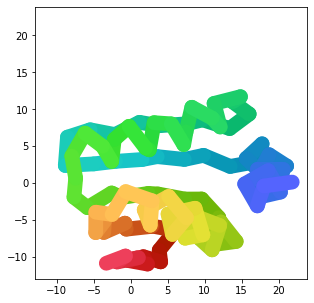

In [ ]:
# lets plot structure at 50 iterations, to see where we are at
# there is a strong bias towards all-alpha structures, so if design not going where you want, you can rerun cell above.
cf.plot_pseudo_3D(outputs["best_outs"]["outputs"]["final_atom_positions"][:,1,:])
plt.show()

In [ ]:
# lets run for another 150 iterations
outputs = do_design(inputs, outputs, iters=150)

50	1	100 loss: 0.766 contact: 0.597 pae: 0.234 plddt: 0.233
51	1	100 loss: 0.742 contact: 0.634 pae: 0.213 plddt: 0.211
52	0	100 loss: 0.849 contact: 0.408 pae: 0.310 plddt: 0.336
52	1	100 loss: 0.816 contact: 0.486 pae: 0.277 plddt: 0.296
53	0	100 loss: 0.825 contact: 0.465 pae: 0.285 plddt: 0.308
54	0	100 loss: 0.803 contact: 0.568 pae: 0.257 plddt: 0.262
54	1	100 loss: 0.818 contact: 0.531 pae: 0.272 plddt: 0.281
55	0	100 loss: 0.791 contact: 0.554 pae: 0.249 plddt: 0.266
56	0	100 loss: 0.787 contact: 0.563 pae: 0.245 plddt: 0.261
56	0	100 loss: 0.837 contact: 0.523 pae: 0.286 plddt: 0.290
57	1	100 loss: 0.851 contact: 0.502 pae: 0.293 plddt: 0.307
58	0	100 loss: 0.853 contact: 0.500 pae: 0.294 plddt: 0.309
58	1	100 loss: 0.821 contact: 0.640 pae: 0.262 plddt: 0.239
59	1	100 loss: 0.804 contact: 0.579 pae: 0.254 plddt: 0.260
60	1	100 loss: 0.790 contact: 0.535 pae: 0.255 plddt: 0.268
61	0	100 loss: 0.789 contact: 0.599 pae: 0.240 plddt: 0.249
62	0	100 loss: 0.777 contact: 0.545 pae:

In [ ]:
pos_ref = np.array(outputs["best_outs"]["outputs"]["final_atom_positions"][:,1,:])
HTML(make_animation(**outputs["traj"], pos_ref=pos_ref))

In [ ]:
save_pdb(outputs["best_outs"],"dream.tmp.pdb")
plot_pdb("dream.tmp.pdb")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [ ]:
print(get_seqs(outputs["best_outs"]["seq"]))

MPNIEIMQAMMETHCARHSMTMKNGGRVMTTDGNQEGVERFEDAFVNECMTNPRRLTITCTSRRCARMIKMYVKEFVKHHNVMWKAKYHNDGNTVTVRPM


#MSA design
WARNING: It is EASY to design an adversarial (aka. garbage) MSA to reproduce any fold or constraint. To avoid the adversarial mode, we add an entropy term to push the sequences to be similar.

In [ ]:
example = "6WVS"
!wget -qnc https://files.rcsb.org/view/{example}.pdb

# to design MSA set num_seq > 1
MODEL = prep_model(32, num_recycles, dropout, recycle_mode, num_models)
inputs = prep_inputs(MODEL, f"{example}.pdb", chain="A")

In [ ]:
outputs = do_design(inputs, iters=50, ent_weight=0.01, conf_weight=0.0)
# increase entropy weight every 50 iterations
for ent_weight in [0.02,0.04,0.08,0.16,0.32]:
  outputs["loss"] = np.inf # reset loss (since we want the best result saved with high entropy weight)
  outputs = do_design(inputs, outputs, iters=50, ent_weight=ent_weight, conf_weight=0.1)

0	182 loss: 2.985 ent: 2.569 seqid: 0.055 pae: 0.709 plddt: 0.458 dgram: 2.959 fape: 4.367 rmsd: 28.378
2	182 loss: 2.953 ent: 2.499 seqid: 0.054 pae: 0.648 plddt: 0.553 dgram: 2.928 fape: 2.985 rmsd: 18.027
4	182 loss: 2.925 ent: 2.461 seqid: 0.052 pae: 0.634 plddt: 0.547 dgram: 2.900 fape: 2.661 rmsd: 17.125
7	182 loss: 2.679 ent: 2.418 seqid: 0.058 pae: 0.650 plddt: 0.578 dgram: 2.654 fape: 2.549 rmsd: 12.135
9	182 loss: 2.595 ent: 2.403 seqid: 0.057 pae: 0.655 plddt: 0.604 dgram: 2.571 fape: 2.568 rmsd: 11.154
10	182 loss: 2.575 ent: 2.397 seqid: 0.057 pae: 0.585 plddt: 0.549 dgram: 2.551 fape: 2.452 rmsd: 10.522
13	182 loss: 2.526 ent: 2.367 seqid: 0.058 pae: 0.618 plddt: 0.573 dgram: 2.502 fape: 2.465 rmsd: 9.799
15	182 loss: 2.481 ent: 2.333 seqid: 0.058 pae: 0.587 plddt: 0.543 dgram: 2.457 fape: 2.518 rmsd: 9.262
19	182 loss: 2.479 ent: 2.302 seqid: 0.057 pae: 0.535 plddt: 0.480 dgram: 2.456 fape: 2.516 rmsd: 8.383
21	182 loss: 2.463 ent: 2.288 seqid: 0.060 pae: 0.495 plddt: 0.

In [ ]:
pos_ref = inputs["batch"]["all_atom_positions"][:,1,:]
HTML(make_animation(**outputs["traj"], pos_ref=pos_ref))

In [ ]:
for s in get_seqs(outputs["best_outs"]["seq"]):
  print(s)

SQYMNTSFTTTATIMFMTTVAYYEFVTTAVMCTTTTVYLLAATTVECLVVTNSASTTTAACSYAMLAATQLLSASVSFRTTTFTASSVATGVVQSIHTAFTAAAVFRYTAALYTMSTYLTRTVATFEETYTAIQTANVITNVNKFTCLSARTAFLTKATRTVYAYVVTQSTAAAATRASNTT
IRYSTFFATSIVTAFVVTTVQYLLFALTASSYTSTSSQSTLTTLVYRLCVFMYASLTTAAAAMITHYITQPLSTSVISTTATYLLFISATTQTMYHAAAQTPSATFLVVAAAYTALTMEQVMAAFTFYVITAAVTTNITIPMVTTMFLFSLLTFMTRAILSHVATYMPFSMFYFTYFAYATT
IQVMFTSFTTTVTASQKTTLTHLENATTAVMYTSVTSQSYYTTLRNRQVTYMTSSTRTANAATASQMITEPLTTSMSQRNTTMNSSQRATTVVMFISTAPFAAAVVLATAAALTASHYRTTNQAFTPFTVTTVVTLTVTHTVTMTMMLSTITTFTTITTRTCTAMVMITHMLYATTTAITTT
CYYVLSTFMTTVAAVAITTLAYLLFYKTAVSTSSTTMQSLFAQTVNMIQTIMYASTTTAAAATQKLKITKLLFTSHSSRTTTFCIRSVATTLVHYIATTPTTSAVKLKTAAATTFTIYRFSMNFTTFKTYATAQTLNVTHTMTTLFFLSAITTMHTRATRWHVAETVVNHTFYATATASATT
CGPMVTTATTIAMASAAYTVYYYLYAYTSVMSASTTVYSTITTTVRVTSTYNYAILYTANAATYTLYITENLTVSVMGYNATDCLFIKLTTVTMSIATAQLGSAVVNATAIATTASHTRTTNVVWHYYTATLAQTLFVSTVVVMTFFLSSRTTILTITSLTATAARVTNTMFVAMTVASLTT
IRTVVTTFTTTVTASVVTTVAYYLAALTSVMTVSTTVAIYYNTLYTMMQNFGYASLRTAAASCAMLHITEPYIVVAYDYTAKYLA

#EXPERIMENTAL

For more complex targets, we find directly optimizing a *single* one_hot encoded sequence (even with gumbel-st) to be very challenging. To "fix" this we try two different approaches:


1.   Start with a continious representation and then one residue at a time switch to one_hot in second round of optimization. 
2.   Start with an MSA then deactivate sequences one at a time until you are left with just one (not yet implemented in colab).




In [ ]:
example = "1QJG"
!wget -qnc https://files.rcsb.org/view/{example}.pdb

MODEL = prep_model(1, num_recycles, dropout, recycle_mode, num_models)
inputs = prep_inputs(MODEL, f"{example}.pdb", chain="A")

**design adversarial vector**

In [ ]:
outputs = do_design(inputs, one_hot=False)

2	0 loss: 4.244 seqid: 0.040 pae: 0.630 plddt: 0.318 dgram: 4.149 fape: 3.805 rmsd: 30.376
3	0 loss: 4.168 seqid: 0.032 pae: 0.688 plddt: 0.366 dgram: 4.062 fape: 3.833 rmsd: 30.052
8	0 loss: 4.081 seqid: 0.056 pae: 0.631 plddt: 0.325 dgram: 3.986 fape: 2.927 rmsd: 20.570
10	0 loss: 3.708 seqid: 0.040 pae: 0.640 plddt: 0.421 dgram: 3.601 fape: 3.338 rmsd: 23.875
11	0 loss: 3.596 seqid: 0.040 pae: 0.630 plddt: 0.434 dgram: 3.490 fape: 3.038 rmsd: 20.854
13	0 loss: 3.514 seqid: 0.040 pae: 0.600 plddt: 0.493 dgram: 3.405 fape: 2.700 rmsd: 17.815
16	0 loss: 3.427 seqid: 0.064 pae: 0.599 plddt: 0.485 dgram: 3.319 fape: 2.644 rmsd: 19.557
17	0 loss: 3.391 seqid: 0.064 pae: 0.614 plddt: 0.491 dgram: 3.281 fape: 2.618 rmsd: 19.371
24	0 loss: 3.254 seqid: 0.080 pae: 0.679 plddt: 0.612 dgram: 3.125 fape: 2.567 rmsd: 18.348
30	0 loss: 3.212 seqid: 0.072 pae: 0.712 plddt: 0.629 dgram: 3.077 fape: 2.745 rmsd: 21.396
33	0 loss: 3.140 seqid: 0.064 pae: 0.713 plddt: 0.634 dgram: 3.006 fape: 2.669 rmsd

**design one_hot**

In [ ]:
# one_hot_switch=2, every 2 iterations switch one position to one_hot
outputs = do_design(inputs, outputs, iters=outputs["L"]*2+100, one_hot=True, one_hot_switch=2)

200	0 loss: 1.466 seqid: 0.176 pae: 0.128 plddt: 0.093 dgram: 1.444 fape: 0.460 rmsd: 1.229
201	0 loss: 1.433 seqid: 0.176 pae: 0.105 plddt: 0.060 dgram: 1.417 fape: 0.507 rmsd: 1.210
202	1 loss: 1.438 seqid: 0.168 pae: 0.108 plddt: 0.063 dgram: 1.421 fape: 0.560 rmsd: 1.182
204	2 loss: 1.483 seqid: 0.184 pae: 0.129 plddt: 0.085 dgram: 1.462 fape: 0.482 rmsd: 1.286
205	2 loss: 1.426 seqid: 0.184 pae: 0.129 plddt: 0.096 dgram: 1.404 fape: 0.596 rmsd: 1.173
206	3 loss: 1.470 seqid: 0.192 pae: 0.133 plddt: 0.104 dgram: 1.446 fape: 0.677 rmsd: 1.171
208	4 loss: 1.455 seqid: 0.192 pae: 0.134 plddt: 0.093 dgram: 1.432 fape: 0.460 rmsd: 1.191
209	5 loss: 1.470 seqid: 0.184 pae: 0.116 plddt: 0.080 dgram: 1.450 fape: 0.497 rmsd: 1.302
211	7 loss: 1.567 seqid: 0.184 pae: 0.141 plddt: 0.112 dgram: 1.541 fape: 0.502 rmsd: 1.580
212	8 loss: 1.472 seqid: 0.192 pae: 0.117 plddt: 0.077 dgram: 1.453 fape: 0.466 rmsd: 1.284
213	8 loss: 1.415 seqid: 0.192 pae: 0.115 plddt: 0.073 dgram: 1.397 fape: 0.478 

In [ ]:
pos_ref = inputs["batch"]["all_atom_positions"][:,1,:]
HTML(make_animation(**outputs["traj"], pos_ref=pos_ref))

In [ ]:
save_pdb(outputs["best_outs"],"tmp.pdb")
plot_pdb("tmp.pdb")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [ ]:
print(get_seqs(outputs["best_outs"]["seq"]))

ANTATAIREAMERFIRCINEGDVERVTDMFSEDARVQPHHGGRQYTGREQVRDYFRKWMGHRWTMTVCEPIPETNNHDTMTVVMTHTHHGVEYVKVYTIHMHCDTTGTVTRLHMHHTPKSKHPVA
